##### Workshop Task: Estimating Target Coordinates
###### The goal of this workshop is to solve the following task:
###### Given an image of a target, estimate the coordinates of its center.

###### **Tasks:**
###### 1. **Data Onboarding**: Load and understand the data.
###### 2. **Feature Extraction (Optional)**: Consider whether feature extraction is needed for accurate classification.
###### 3. **Data Division**: Split data into training, validation, and test sets.
###### 4. **Training Procedure**: Implement training using a neural network.
###### 5. **Evaluation**: Evaluate the trained network on the test set and visualize results.
##### Please Extract zip file and put data in same file with code
## Part one: Data Onboarding
#### In this section, we load and understand the data.


In [19]:
import os
                                                                                    # extracted data 
ArmanGolbidi_image_directory = 'images'                                             # images directory
ArmanGolbidi_training_csv_path = 'train.csv'                                        # train.csv path
ArmanGolbidi_testing_csv_path = 'test.csv'                                          # test.csv path
                                                                                    # verify
print(f"Image directory: {ArmanGolbidi_image_directory}")
print(f"Training CSV path: {ArmanGolbidi_training_csv_path}")
print(f"Testing CSV path: {ArmanGolbidi_testing_csv_path}")
                                                                                    # Check
if not os.path.exists(ArmanGolbidi_image_directory):
    print(f"Error: Image directory does not exist at {ArmanGolbidi_image_directory}")
if not os.path.exists(ArmanGolbidi_training_csv_path):
    print(f"Error: Training CSV does not exist at {ArmanGolbidi_training_csv_path}")
if not os.path.exists(ArmanGolbidi_testing_csv_path):
    print(f"Error: Testing CSV does not exist at {ArmanGolbidi_testing_csv_path}")

Image directory: images
Training CSV path: train.csv
Testing CSV path: test.csv


## Part Two: Feature Extraction (Optional)
#### Although feature extraction is optional, it's worth considering if additional features could improve the accuracy of the model in estimating the target center.
#### Here, we define the dataset and prepare it for input into the model, including transformations.


In [6]:
import os
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader, random_split
from torchvision import transforms
from PIL import Image
import pandas as pd
ArmanGolbidi_training_dataframe = pd.read_csv(ArmanGolbidi_training_csv_path)
ArmanGolbidi_testing_dataframe = pd.read_csv(ArmanGolbidi_testing_csv_path)
class ArmanGolbidiDataset(Dataset):
    def __init__(self, dataframe, directory_path, image_transform=None):
        self.dataframe = dataframe
        self.directory_path = directory_path
        self.image_transform = image_transform

    def __len__(self):
        return len(self.dataframe)
    def __getitem__(self, index):
        image_file_name = os.path.join(self.directory_path, self.dataframe.iloc[index, 0])
        image = Image.open(image_file_name).convert("RGB")
        if self.image_transform:
            image = self.image_transform(image)
        coordinates = torch.tensor([self.dataframe.iloc[index, 1], self.dataframe.iloc[index, 2]], dtype=torch.float32)
        return image, coordinates
# Combine all image transformations into a pipeline.
ArmanGolbidi_image_transformations = transforms.Compose([
    transforms.Resize((128, 128)),
    transforms.ToTensor(),
])
ArmanGolbidi_training_dataset = ArmanGolbidiDataset(ArmanGolbidi_training_dataframe, ArmanGolbidi_image_directory, image_transform=ArmanGolbidi_image_transformations)
ArmanGolbidi_testing_dataset = ArmanGolbidiDataset(ArmanGolbidi_testing_dataframe, ArmanGolbidi_image_directory, image_transform=ArmanGolbidi_image_transformations)

## Part Three: Data Division
#### The data is divided into train, validation, and test subsets. The validation subset is used to estimate the model's generalization performance during training.
#### Split the training dataset into training and validation datasets

In [3]:
ArmanGolbidi_training_size = int(0.8 * len(ArmanGolbidi_training_dataset))
ArmanGolbidi_validation_size = len(ArmanGolbidi_training_dataset) - ArmanGolbidi_training_size
ArmanGolbidi_training_dataset, ArmanGolbidi_validation_dataset = random_split(ArmanGolbidi_training_dataset, [ArmanGolbidi_training_size, ArmanGolbidi_validation_size])

ArmanGolbidi_training_loader = DataLoader(ArmanGolbidi_training_dataset, batch_size=32, shuffle=True)
ArmanGolbidi_validation_loader = DataLoader(ArmanGolbidi_validation_dataset, batch_size=32, shuffle=False)
ArmanGolbidi_testing_loader = DataLoader(ArmanGolbidi_testing_dataset, batch_size=32, shuffle=False)


## Part Four: Implementing the Training Procedure
#### We use a neural network to estimate the center coordinates of the target in each image. 
#### The example provided here is modified to fit our data and task requirements.
#### Questions to consider: Is the architecture suitable? Should the loss function be changed?



In [5]:
class ArmanGolbidiCNN(nn.Module):
    def __init__(self):
        super(ArmanGolbidiCNN, self).__init__()
        self.convolution1 = nn.Conv2d(3, 16, kernel_size=3, stride=1, padding=1)
        self.convolution2 = nn.Conv2d(16, 32, kernel_size=3, stride=1, padding=1)
        self.convolution3 = nn.Conv2d(32, 64, kernel_size=3, stride=1, padding=1)
        self.fully_connected1 = nn.Linear(64 * 16 * 16, 128)
        self.fully_connected2 = nn.Linear(128, 2)
        self.pooling_layer = nn.MaxPool2d(2, 2)
        self.activation = nn.ReLU()
    def forward(self, x):
        x = self.pooling_layer(self.activation(self.convolution1(x)))
        x = self.pooling_layer(self.activation(self.convolution2(x)))
        x = self.pooling_layer(self.activation(self.convolution3(x)))
        x = x.view(-1, 64 * 16 * 16)
        x = self.activation(self.fully_connected1(x))
        x = self.fully_connected2(x)
        return x
ArmanGolbidi_neural_network = ArmanGolbidiCNN()
ArmanGolbidi_loss_function = nn.MSELoss()  # Consider if MSE is appropriate for coordinate prediction
ArmanGolbidi_optimizer_function = optim.Adam(ArmanGolbidi_neural_network.parameters(), lr=0.001)

## Part Five: Training the Network
#### In this section, we implement the training loop, measuring both training and validation loss to monitor model performance.



In [9]:
ArmanGolbidi_total_epochs = 32
for epoch in range(ArmanGolbidi_total_epochs):
    ArmanGolbidi_neural_network.train()
    ArmanGolbidi_running_loss_value = 0.0
    for images, coordinates in ArmanGolbidi_training_loader:
        ArmanGolbidi_optimizer_function.zero_grad()
        outputs = ArmanGolbidi_neural_network(images)
        loss = ArmanGolbidi_loss_function(outputs, coordinates)
        loss.backward()
        ArmanGolbidi_optimizer_function.step()
        ArmanGolbidi_running_loss_value += loss.item()
    ArmanGolbidi_neural_network.eval()
    ArmanGolbidi_validation_loss_value = 0.0
    with torch.no_grad():
        for images, coordinates in ArmanGolbidi_validation_loader:
            outputs = ArmanGolbidi_neural_network(images)
            loss = ArmanGolbidi_loss_function(outputs, coordinates)
            ArmanGolbidi_validation_loss_value += loss.item()
    print(f"Epoch [{epoch+1}/{ArmanGolbidi_total_epochs}], Training Loss: {ArmanGolbidi_running_loss_value/len(ArmanGolbidi_training_loader):.4f}, Validation Loss: {ArmanGolbidi_validation_loss_value/len(ArmanGolbidi_validation_loader):.4f}")


Epoch [1/32], Training Loss: 7.9706, Validation Loss: 12.8060
Epoch [2/32], Training Loss: 7.2648, Validation Loss: 12.8382
Epoch [3/32], Training Loss: 7.1672, Validation Loss: 11.8190
Epoch [4/32], Training Loss: 7.0014, Validation Loss: 11.4395
Epoch [5/32], Training Loss: 7.3000, Validation Loss: 11.9314
Epoch [6/32], Training Loss: 6.3456, Validation Loss: 13.0524
Epoch [7/32], Training Loss: 8.4768, Validation Loss: 11.5078
Epoch [8/32], Training Loss: 7.0705, Validation Loss: 11.0362
Epoch [9/32], Training Loss: 6.8684, Validation Loss: 12.2630
Epoch [10/32], Training Loss: 5.8003, Validation Loss: 11.6179
Epoch [11/32], Training Loss: 5.6885, Validation Loss: 10.6336
Epoch [12/32], Training Loss: 5.7567, Validation Loss: 13.9610
Epoch [13/32], Training Loss: 6.5922, Validation Loss: 10.9438
Epoch [14/32], Training Loss: 5.1752, Validation Loss: 11.4924
Epoch [15/32], Training Loss: 4.5411, Validation Loss: 11.0517
Epoch [16/32], Training Loss: 4.8537, Validation Loss: 9.9526
Ep

## Part Six: Evaluate the Trained Network on the Test Subset
#### Evaluate the model on the test set and calculate the test loss. Visualize the results by plotting an image with the true and predicted centers.
#### Evaluation on test data

In [10]:
ArmanGolbidi_neural_network.eval()
ArmanGolbidi_testing_loss_value = 0.0
with torch.no_grad():
    for images, coordinates in ArmanGolbidi_testing_loader:
        outputs = ArmanGolbidi_neural_network(images)
        loss = ArmanGolbidi_loss_function(outputs, coordinates)
        ArmanGolbidi_testing_loss_value += loss.item()

print(f"Test Loss: {ArmanGolbidi_testing_loss_value/len(ArmanGolbidi_testing_loader):.4f}")

Test Loss: 6.3078


## Part Seven: Visualization

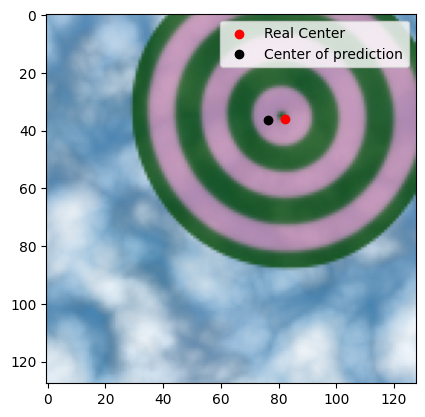

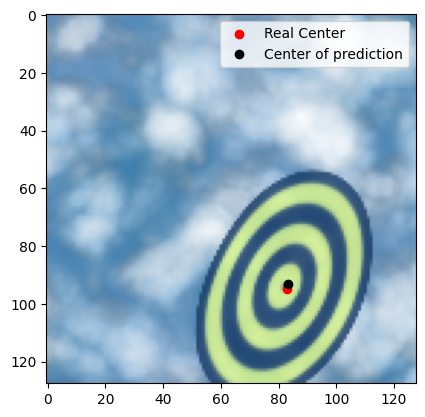

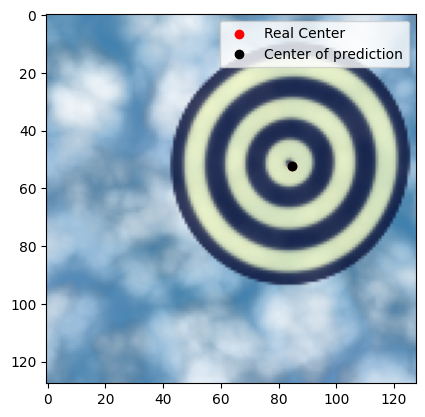

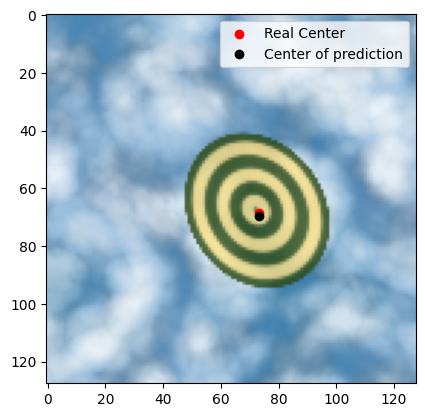

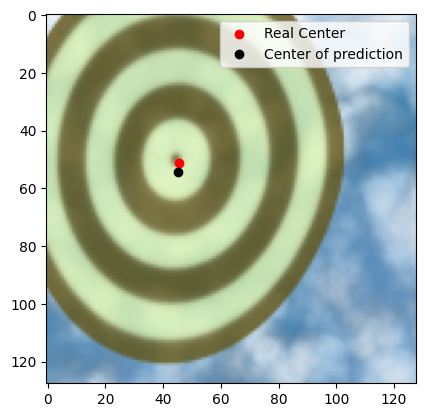

...

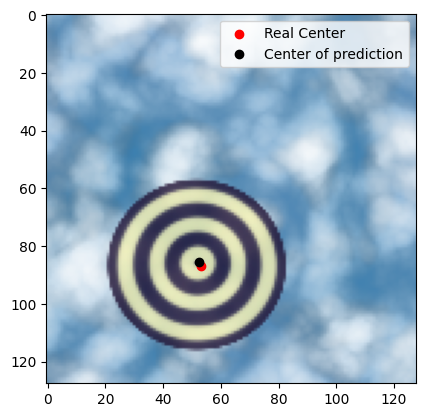

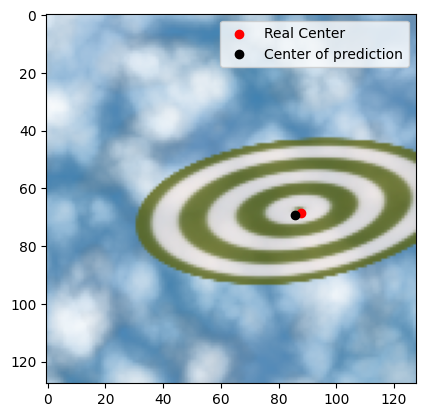

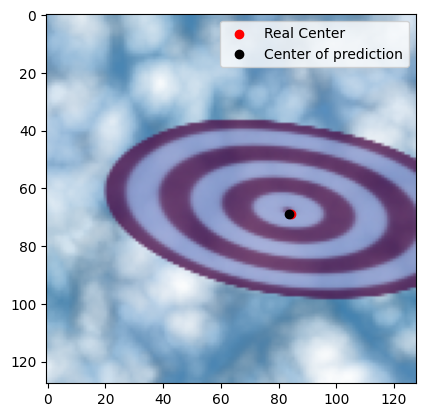

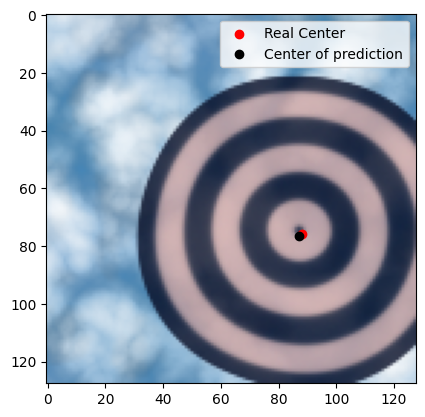

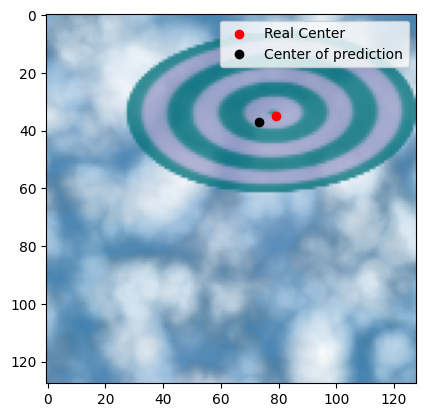

In [16]:
# %%
import matplotlib.pyplot as plt

# Visualize predictions on test data
ArmanGolbidi_neural_network.eval()
with torch.no_grad():
    for i, (images, coordinates) in enumerate(ArmanGolbidi_testing_loader):
        if i == 2:  # Visualize first 2 batches
            break
        outputs = ArmanGolbidi_neural_network(images)

        for j in range(len(images)):
            plt.imshow(images[j].permute(1, 2, 0))
            true_x, true_y = coordinates[j].numpy()
            pred_x, pred_y = outputs[j].numpy()
            plt.scatter([true_x], [true_y], color='red', label='Real Center')
            plt.scatter([pred_x], [pred_y], color='black', label='Center of prediction')
            plt.legend()
            plt.show()

In [19]:
# Save the model
torch.save(ArmanGolbidi_neural_network.state_dict(), 'ArmanGolbidi_target_center_model.pth')
print("Model saved as 'ArmanGolbidi_target_center")

Model saved as 'ArmanGolbidi_target_center
